# v02000 EDA

## Hypothesis

予測値の性質が異なり過ぎて、今の状態では全体のfittingを行えていないのではないか。

## Objective

どうやったら性質の異なる値を予測することができるようになるか、解決の糸口を見つける。


## Problems

- 現在使っている損失関数であるRMSLEは、どこに向かって収束しているのかわからない。
    - （おそらく対数変換した分布の平均より少し大きめのところへ向かっているかと思われる）
- そこで、損失関数をRMSEに変更したい
    - RMSEは基本的に全体の平均へ収束する。

In [1]:
import os
import gc
import re
import json
import pickle
import datetime
from tqdm import tqdm

import numpy as np
import pandas as pd

from typing import Union

import seaborn
import cufflinks as cf
cf.go_offline()ｗ
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
plt.style.use('seaborn-darkgrid')
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}

from scipy.stats import linregress

from sklearn import preprocessing
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error

import lightgbm as lgb

In [10]:
IS_TEST = True
SEED = 42
VERSION = 'v02000'

In [11]:
def read_data():
    files = ['calendar', 'sales_train_validation', 'sell_prices']

    if os.path.exists('/kaggle/input/m5-forecasting-accuracy'):
        data_dir_path = '/kaggle/input/m5-forecasting-accuracy'
        dst_data = {}
        for file in files:
            print(f'Reading {file} ....')
            dst_data[file] = pd.read_csv(data_dir_path + file + '.csv')
    else:
        data_dir_path = '../data/reduced/'
        dst_data = {}
        for file in files:
            print(f'Reading {file} ....')
            dst_data[file] = pd.read_pickle(data_dir_path + file + '.pkl')
    return dst_data.values()

In [12]:
calendar, sales_train_validation, sell_prices = read_data()

Reading calendar ....
Reading sales_train_validation ....
Reading sell_prices ....


In [13]:
print('calendar:')
print(calendar.shape)
display(calendar.head())

print('sales_train_validation:')
print(sales_train_validation.shape)
display(sales_train_validation.head())

print('sell_prices:')
print(sell_prices.shape)
display(sell_prices.head())

calendar:
(1969, 14)


,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


sales_train_validation:
(30490, 1919)


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


sell_prices:
(6841121, 4)


,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.578125
1,CA_1,HOBBIES_1_001,11326,9.578125
2,CA_1,HOBBIES_1_001,11327,8.257812
3,CA_1,HOBBIES_1_001,11328,8.257812
4,CA_1,HOBBIES_1_001,11329,8.257812


In [14]:
def hstack_sales_colums(df, latest_d, stack_days=28):
    # MEMO: 予測日数分のデータをtrain/testに水平結合する。
    add_columns = ['d_' + str(i + 1) for i in range(latest_d, latest_d + stack_days)]
    add_df = pd.DataFrame(index=df.index, columns=add_columns).fillna(0)
    return pd.concat([df, add_df], axis=1)

def melt_data(df, calendar, sell_prices):
    latest_d = 1913
    df = hstack_sales_colums(df, latest_d)
    # Melt Main Data and Join Optinal Data.
    id_columns = ['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']
    df = pd.melt(df, id_vars=id_columns, var_name='d', value_name='sales')
    # Join calendar.
    df = pd.merge(df, calendar, how='left', on='d')
    # Join sell_price.
    df = pd.merge(df, sell_prices, how='left', on=['store_id', 'item_id', 'wm_yr_wk'])
    df.dropna(subset=['sell_price'], axis=0, inplace=True)
    return df

In [15]:
train = melt_data(sales_train_validation, calendar, sell_prices)

In [16]:
train['date'] = pd.to_datetime(train['date'], format='%Y-%m-%d')

In [17]:
print(train.shape)
train.head()

(46881677, 22)


,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
7,HOBBIES_1_008_CA_1_validation,HOBBIES_1_008,HOBBIES_1,HOBBIES,CA_1,CA,d_1,12,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.459961
8,HOBBIES_1_009_CA_1_validation,HOBBIES_1_009,HOBBIES_1,HOBBIES,CA_1,CA,d_1,2,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,1.559570
9,HOBBIES_1_010_CA_1_validation,HOBBIES_1_010,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,3.169922
11,HOBBIES_1_012_CA_1_validation,HOBBIES_1_012,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,5.980469
14,HOBBIES_1_015_CA_1_validation,HOBBIES_1_015,HOBBIES_1,HOBBIES,CA_1,CA,d_1,4,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.700195


## EDA

様々なカテゴリごとに sales の平均値などにどれくらい差があるのか確かめる。

モデルの学習時に、対数変換した値を扱うので、対数変換後の分布をみてみる。

In [18]:
def sales_statistics(groups, target='sales', df=train, agg_cols=['count', 'median', 'max', 'mean', 'std'], plot=True):
    print(f"Group By {', '.join(groups)}\n\n")

    print(f'全体の {target} の平均：', df[target].mean().round(4))
    print(f"{', '.join(groups)} ごとの {target} の統計量：")
    agg_df = df.groupby(groups)[target].agg(agg_cols).round(4)
    display(agg_df)
    if plot:
        agg_df.plot(kind='bar', y='mean', yerr='std', figsize=(20, 5))
        
        pivot_df = pd.pivot_table(df, index='date', columns=groups, values=target, aggfunc='mean')
        if pivot_df.shape[1] < 50:
            is_legend = True if pivot_df.shape[1] < 10 else False
            pivot_df.plot(figsize=(30, 8), rot=0, legend=is_legend)

### Sales By Region

Group By state_id


全体の sales の平均： 1.4013
state_id ごとの sales の統計量：


,count,median,max,mean,std
state_id,,,,,
CA,18559286,0,763,1.5451,4.5516
TX,14343003,0,634,1.3176,4.2445
WI,13979388,0,374,1.2963,3.9068


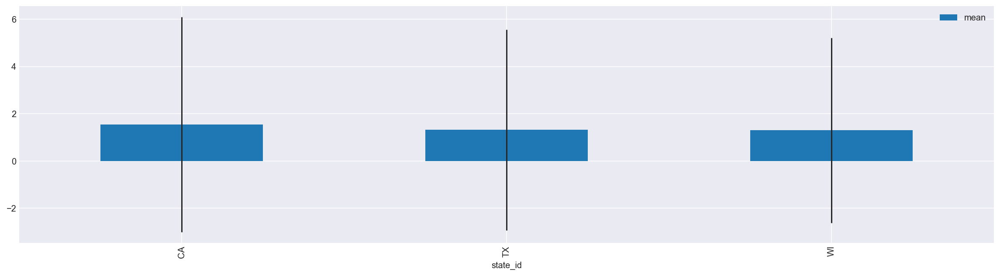

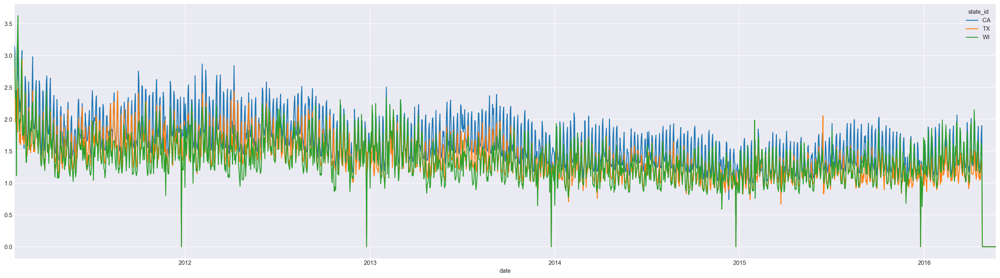

In [19]:
# 州ごと
sales_statistics(groups=['state_id'])

Group By store_id


全体の sales の平均： 1.4013
store_id ごとの sales の統計量：


,count,median,max,mean,std
store_id,,,,,
CA_1,4788267,0,648,1.6077,4.4275
CA_2,4361148,0,227,1.3037,3.1236
CA_3,4757313,0,763,2.3518,6.7999
CA_4,4652558,0,300,0.8820,2.2088
TX_1,4797955,0,634,1.1662,3.6355
TX_2,4807881,0,626,1.5005,4.8290
TX_3,4737167,0,385,1.2854,4.1756
WI_1,4560767,0,224,1.1290,2.6905
WI_2,4646580,0,300,1.4084,4.2853


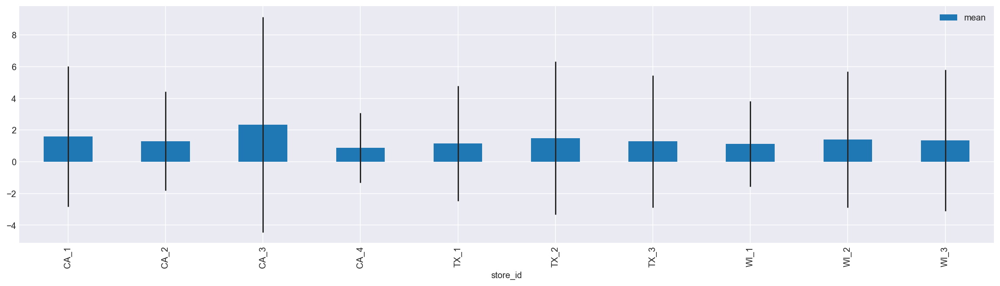

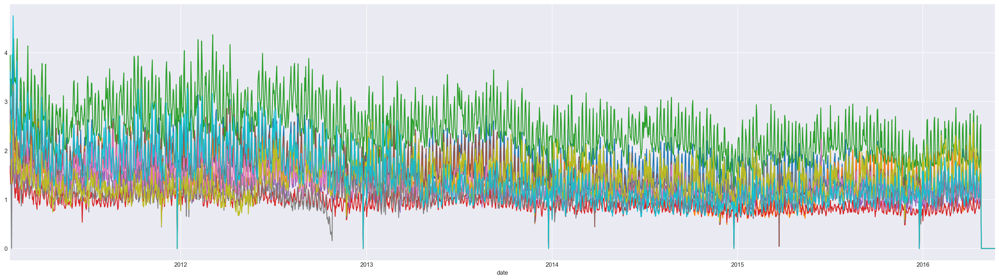

In [20]:
# ストアごと
sales_statistics(groups=['store_id'])

#### We Find

- 州ごとで、sales の分布は少し異なり、平均値も異なった。
- さらに、ストアでは、最も平均値が高い CA_3 と 最も平均値が小さい CA_4 とで平均値の差が 約1.5 あった。
- state_id ごとに違いがあるが、store_id ごとの違いは更に大きい。

### Sales By Item

Group By cat_id


全体の sales の平均： 1.4013
cat_id ごとの sales の統計量：


,count,median,max,mean,std
cat_id,,,,,
FOODS,21798313,0,763,2.0685,5.7061
HOBBIES,8800885,0,294,0.6959,2.2370
HOUSEHOLD,16282479,0,626,0.8893,2.2818


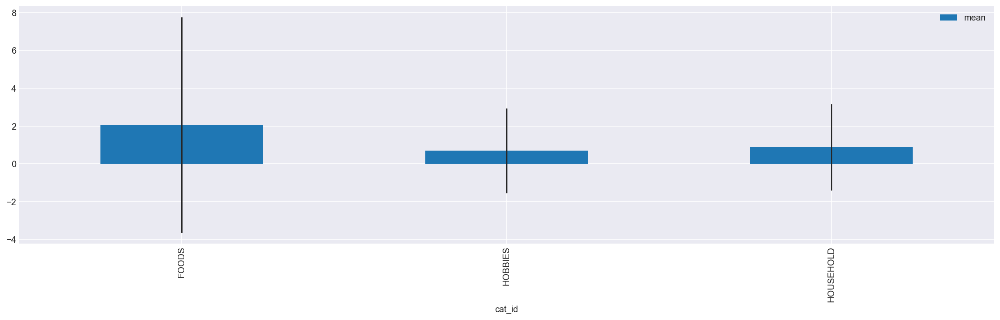

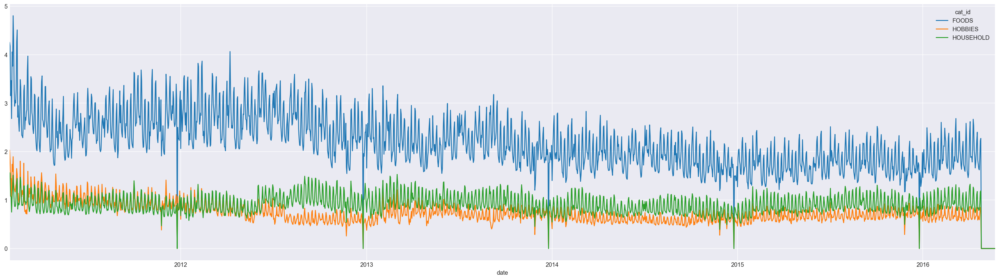

In [21]:
# 商品カテゴリごと
sales_statistics(groups=['cat_id'])

Group By dept_id


全体の sales の平均： 1.4013
dept_id ごとの sales の統計量：


,count,median,max,mean,std
dept_id,,,,,
FOODS_1,3591218,0,166,1.4168,3.2297
FOODS_2,5631795,0,634,1.3548,3.0526
FOODS_3,12575300,1,763,2.5743,6.9772
HOBBIES_1,6585079,0,294,0.8499,2.5206
HOBBIES_2,2215806,0,135,0.2384,0.8452
HOUSEHOLD_1,7946519,0,626,1.4472,3.0376
HOUSEHOLD_2,8335960,0,601,0.3575,0.8915


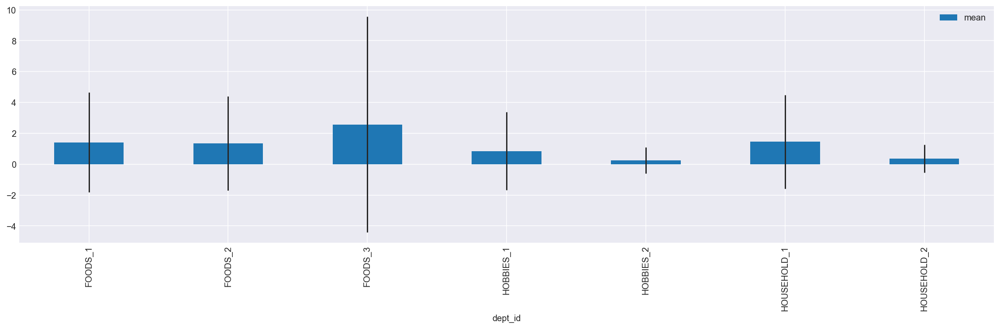

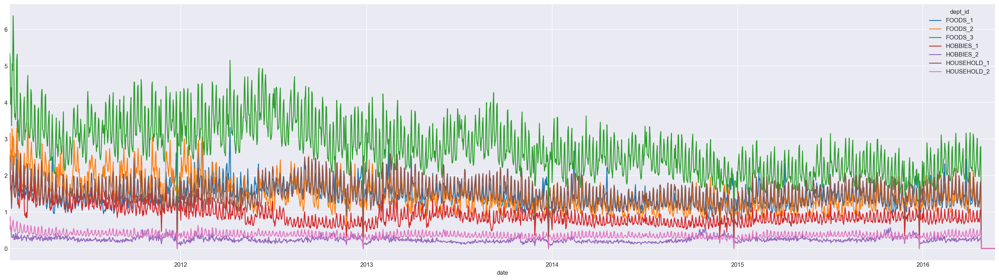

In [22]:
# 商品売り場ごと
sales_statistics(groups=['dept_id'])

In [23]:
# 商品ごと
sales_statistics(groups=['item_id'], plot=False)

Group By item_id


全体の sales の平均： 1.4013
item_id ごとの sales の統計量：


,count,median,max,mean,std
item_id,,,,,
FOODS_1_001,19403,0,24,0.6312,1.3124
FOODS_1_002,19403,0,8,0.3780,0.7563
FOODS_1_003,19410,0,22,0.6901,1.2515
FOODS_1_004,15420,6,116,8.3970,8.5825
FOODS_1_005,19389,0,30,1.1818,2.2368
...,...,...,...,...,...
HOUSEHOLD_2_512,19368,0,17,0.5966,1.1092
HOUSEHOLD_2_513,11451,0,20,0.6913,1.3591
HOUSEHOLD_2_514,19389,0,5,0.1625,0.4463


#### We Find

- cat_id ごとに違いがあり、FOODS が最も平均値が高い。
- dept_id ごとには更に違いがあり、FOODS_3が最も高く、HOUSEHOLD_2が最も低い。
    - 両者では、平均値に 2.379295 の差があった。

### Sales By Region, Item

Group By state_id, cat_id


全体の sales の平均： 1.4013
state_id, cat_id ごとの sales の統計量：


count  median  max    mean     std
state_id cat_id                                         
CA       FOODS      8584347       1  763  2.2362  6.0219
         HOBBIES    3492578       0  294  0.8704  2.7795
         HOUSEHOLD  6482361       0  300  0.9934  2.4390
TX       FOODS      6773457       0  634  1.9128  5.6828
         HOBBIES    2652960       0  183  0.6002  1.8015
         HOUSEHOLD  4916586       0  626  0.8848  2.3155
WI       FOODS      6440509       0  374  2.0087  5.2759
         HOBBIES    2655347       0  259  0.5621  1.7648
         HOUSEHOLD  4883532       0   95  0.7558  2.0084

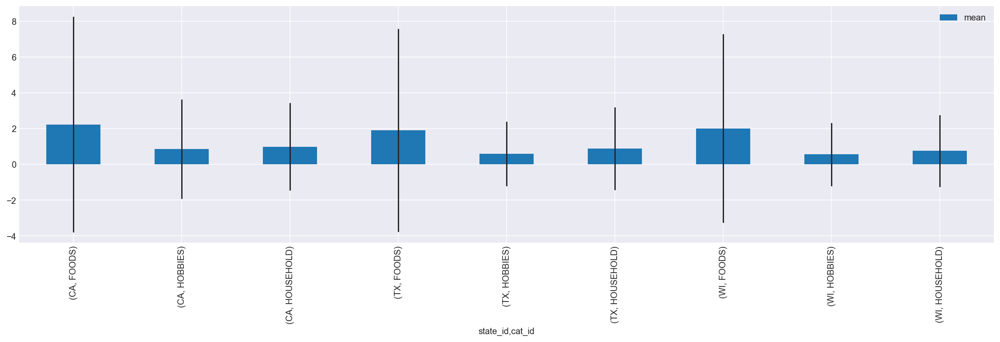

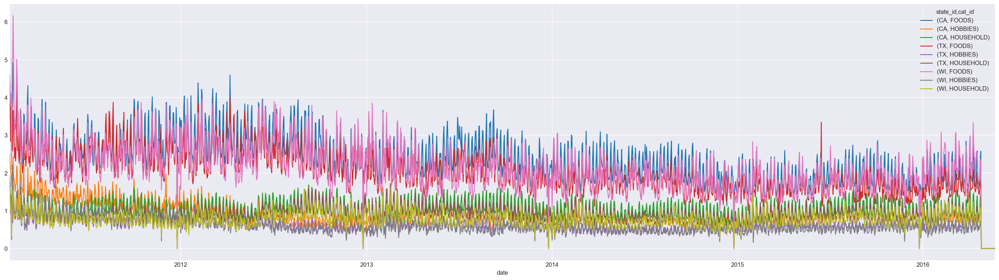

In [24]:
# 州・カテゴリごと
sales_statistics(groups=['state_id', 'cat_id'])

Group By store_id, cat_id


全体の sales の平均： 1.4013
store_id, cat_id ごとの sales の統計量：


count  median  max    mean     std
store_id cat_id                                         
CA_1     FOODS      2260241       1  648  2.3806  5.8584
         HOBBIES     888758       0  294  0.9864  3.0963
         HOUSEHOLD  1639268       0  239  0.8789  1.7819
CA_2     FOODS      1847479       0  227  1.8838  4.0665
         HOBBIES     885832       0   97  0.7200  2.2719
         HOUSEHOLD  1627837       0  119  0.9629  1.9697
CA_3     FOODS      2258036       1  763  3.3285  8.9721
         HOBBIES     885496       0  258  1.0852  3.3126
         HOUSEHOLD  1613781       0  128  1.6802  3.8714
CA_4     FOODS      2218591       0  156  1.2708  2.7158
         HOBBIES     832492       0  160  0.6780  2.2107
         HOUSEHOLD  1601475       0  300  0.4495  0.9986
TX_1     FOODS      2274276       0  634  1.6613  4.7707
         HOBBIES     883613       0  183  0.4856  1.6233
         HOUSEHOLD  1640066       0  601  0.8463  2.2345
TX_2     FOODS      2276439       0  412  2.2031  6.4949
         HOBBIES     887911       0  135  0.7163  1.9609
         HOUSEHOLD  1643531       0  626  0.9512  2.5283
TX_3     FOODS      2222742       0  385  1.8730  5.6363
         HOBBIES     881436       0  148  0.5982  1.7962
         HOUSEHOLD  1632989       0  120  0.8567  2.1652
WI_1     FOODS      2043598       0  224  1.6825  3.4722
         HOBBIES     886140       0   94  0.7399  2.1268
         HOUSEHOLD  1631029       0   58  0.6468  1.4072
WI_2     FOODS      2144370       0  300  2.2236  5.7326
         HOBBIES     881884       0   96  0.4198  1.4406
         HOUSEHOLD  1620326       0   95  0.8675  2.5175
WI_3     FOODS      2252541       0  374  2.1002  6.1003
         HOBBIES     887323       0  259  0.5259  1.6394
         HOUSEHOLD  1632177       0   67  0.7539  1.9426

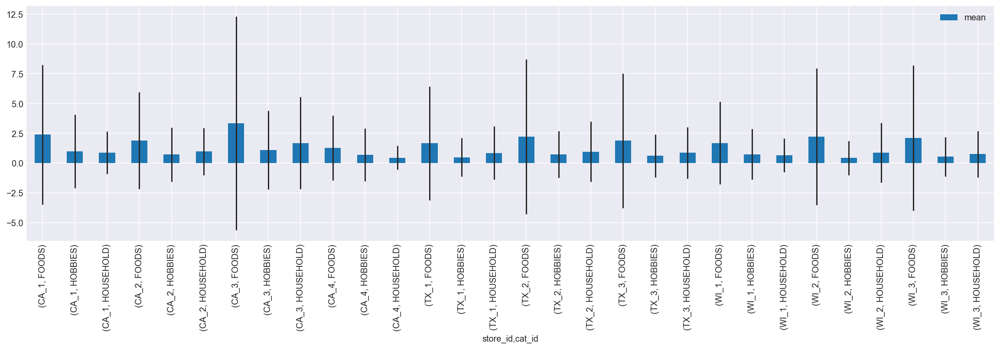

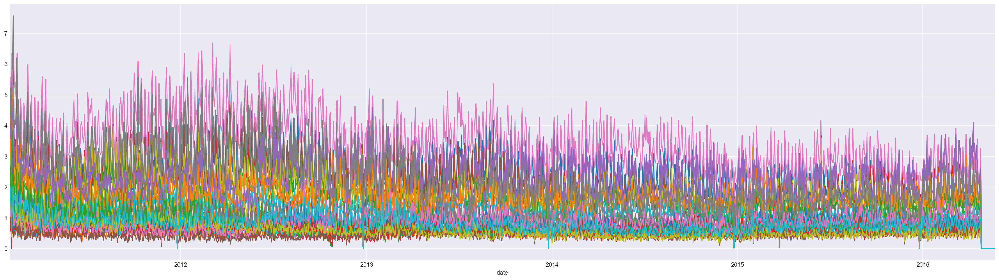

In [25]:
# ストア・カテゴリごと
sales_statistics(groups=['store_id', 'cat_id'])

Group By store_id, dept_id


全体の sales の平均： 1.4013
store_id, dept_id ごとの sales の統計量：


count  median  max    mean     std
store_id dept_id                                          
CA_1     FOODS_1       357964       0   92  1.5863  3.2043
         FOODS_2       622095       0   94  1.4228  3.2009
         FOODS_3      1280182       1  648  3.0682  7.1869
         HOBBIES_1     663431       0  294  1.2383  3.5134
         HOBBIES_2     225327       0   70  0.2448  0.8566
...                       ...     ...  ...     ...     ...
WI_3     FOODS_3      1266616       1  374  2.7793  7.6477
         HOBBIES_1     665125       0  259  0.6405  1.8361
         HOBBIES_2     222198       0   61  0.1830  0.6958
         HOUSEHOLD_1   801059       0   67  1.2704  2.5917
         HOUSEHOLD_2   831118       0   44  0.2561  0.6573

[70 rows x 5 columns]

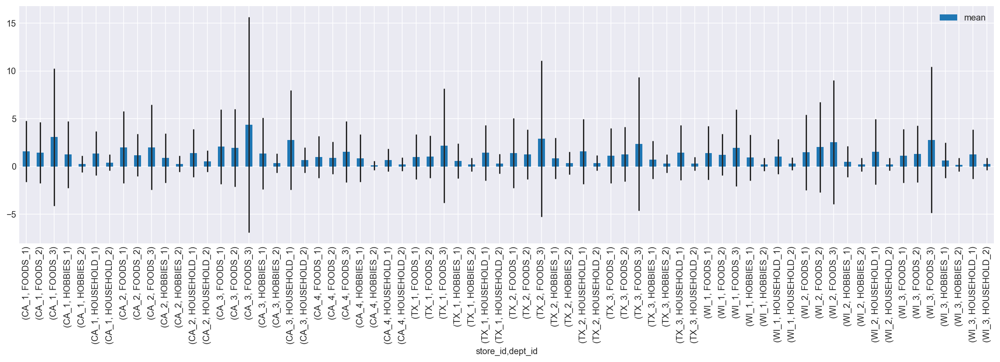

In [26]:
# ストア・カテゴリごと
sales_statistics(groups=['store_id', 'dept_id'])

In [27]:
# ストア・カテゴリごと
sales_statistics(groups=['store_id', 'item_id'], plot=False)

Group By store_id, item_id


全体の sales の平均： 1.4013
store_id, item_id ごとの sales の統計量：


count  median  max     mean     std
store_id item_id                                             
CA_1     FOODS_1_001       1941     0.0   15   0.7743  1.2525
         FOODS_1_002       1941     0.0    8   0.4709  0.8000
         FOODS_1_003       1941     0.0    9   0.8202  1.1591
         FOODS_1_004       1542     9.0   71  10.2445  8.7846
         FOODS_1_005       1941     0.0   26   1.1458  2.0059
...                         ...     ...  ...      ...     ...
WI_3     HOUSEHOLD_2_512   1941     0.0    5   0.3060  0.6431
         HOUSEHOLD_2_513   1143     0.0    6   0.5267  0.8551
         HOUSEHOLD_2_514   1941     0.0    3   0.1066  0.3524
         HOUSEHOLD_2_515    856     0.0    3   0.1320  0.3840
         HOUSEHOLD_2_516   1941     0.0    3   0.1262  0.3717

[30490 rows x 5 columns]

特に、cat_id 以下の階層になると平均値のばらつきと分布の広がりが気になってくる。

これでは、平均値に向かって収束するRMSEでの最適化が望めない。

そのため、何らかの方で平均値を揃えることが必要だと考えられる。

### cat_id ごとにおける sales の scaling

平均値を揃えるために、平均値０・分散１に調整する標準化するスケーラーをとして用いてみる。

可視化の結果から、以下の組み合わせのgroupsで平均値の乖離が気になった。

- cat_id
- dept_id
- store_id, cat_id（ or state_id, cat_id）

最も単純な cat_id で標準化し、改めて可視化をすることで、全体平均が整うかを確認する。

In [28]:
from sklearn.preprocessing import StandardScaler

In [30]:
catId_scalers = {}

target = 'sales'
groups = ['dept_id']
group_name = ''.join([s.capitalize() for g in groups for s in g.split('_')])
scaled_target_col = f'ScaledBy{group_name}_{target}'
train[scaled_target_col] = 0.0
for catId, g_df in train.groupby(groups):
    data = g_df[target].values.reshape(-1, 1)
    # TODO: 直近のデータのみにサンプリングしてもいいかもしれない。
    
    scaler = StandardScaler()
    scaler.fit(data)
    catId_scalers[catId] = scaler
    
    train.loc[g_df.index, scaled_target_col] = catId_scalers[catId].transform(data)

Group By dept_id


全体の sales の平均： 1.4013
dept_id ごとの sales の統計量：


,count,median,max,mean,std
dept_id,,,,,
FOODS_1,3591218,0,166,1.4168,3.2297
FOODS_2,5631795,0,634,1.3548,3.0526
FOODS_3,12575300,1,763,2.5743,6.9772
HOBBIES_1,6585079,0,294,0.8499,2.5206
HOBBIES_2,2215806,0,135,0.2384,0.8452
HOUSEHOLD_1,7946519,0,626,1.4472,3.0376
HOUSEHOLD_2,8335960,0,601,0.3575,0.8915


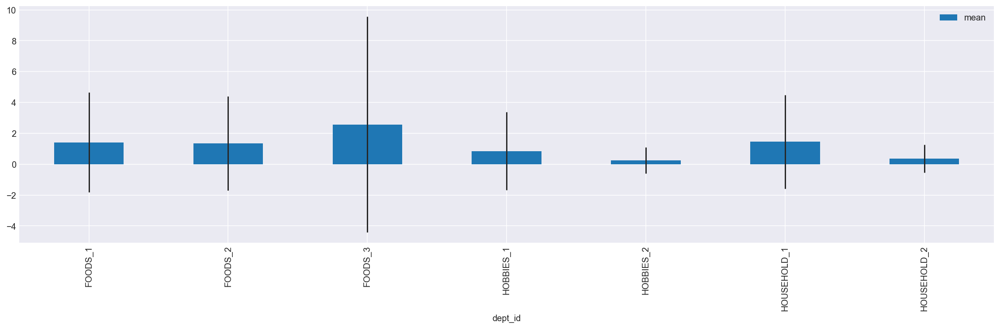

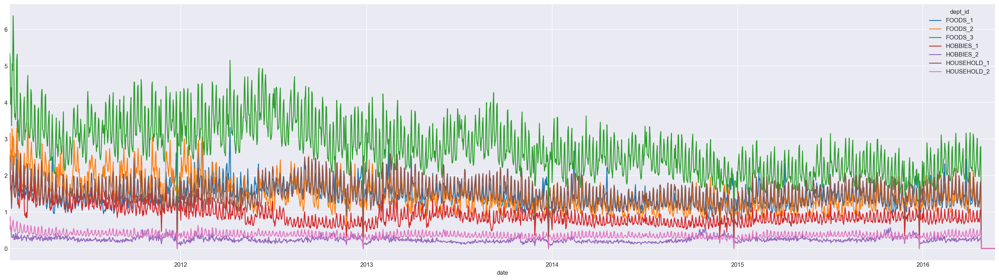

In [31]:
# 商品カテゴリごと
sales_statistics(groups=groups)

Group By dept_id


全体の ScaledByDeptId_sales の平均： 0.0
dept_id ごとの ScaledByDeptId_sales の統計量：


,count,median,max,mean,std
dept_id,,,,,
FOODS_1,3591218,-0.4387,50.9593,-0.0,1.0
FOODS_2,5631795,-0.4438,207.2513,-0.0,1.0
FOODS_3,12575300,-0.2256,108.9871,0.0,1.0
HOBBIES_1,6585079,-0.3372,116.3015,-0.0,1.0
HOBBIES_2,2215806,-0.2821,159.4367,-0.0,1.0
HOUSEHOLD_1,7946519,-0.4764,205.6076,0.0,1.0
HOUSEHOLD_2,8335960,-0.4010,673.7322,0.0,1.0


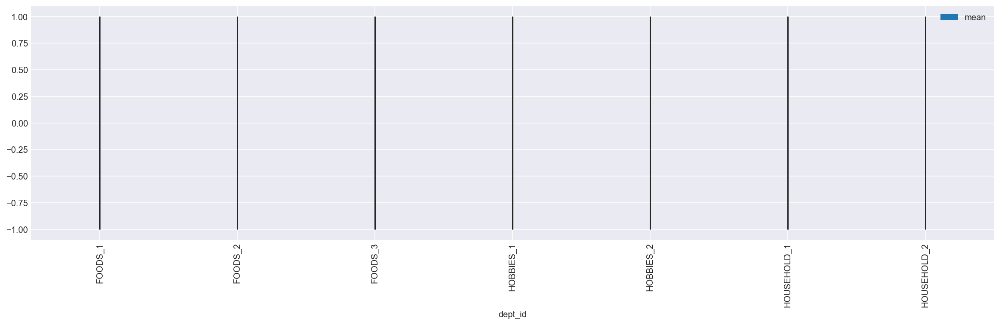

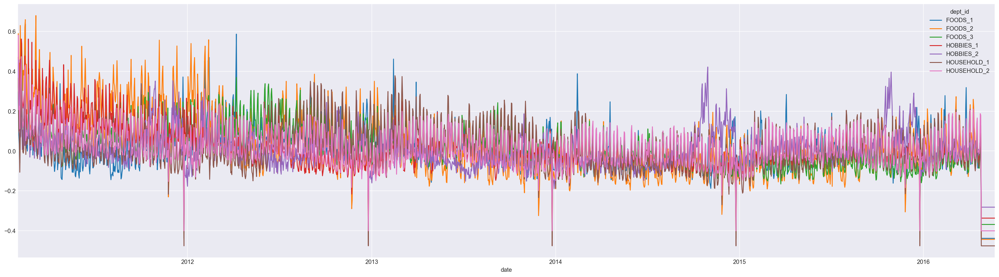

In [32]:
# 商品カテゴリごと
sales_statistics(groups=groups, target=scaled_target_col)

## Demo Training

reference: https://www.kaggle.com/ragnar123/very-fst-model

In [33]:
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [34]:
def transform(data):
    nan_features = ['event_name_1', 'event_type_1', 'event_name_2', 'event_type_2']
    for feature in nan_features:
        data[feature].fillna('unknown', inplace = True)
        
    cat = ['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2']
    for feature in cat:
        encoder = preprocessing.LabelEncoder()
        data[feature] = encoder.fit_transform(data[feature])
        
    return data

def simple_fe(data, target='sales'):
    # rolling demand features
    data['lag_t28'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28))
    data['lag_t29'] = data.groupby(['id'])[target].transform(lambda x: x.shift(29))
    data['lag_t30'] = data.groupby(['id'])[target].transform(lambda x: x.shift(30))
    data['rolling_mean_t7'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(7).mean())
    data['rolling_std_t7'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(7).std())
    data['rolling_mean_t30'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(30).mean())
    data['rolling_mean_t90'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(90).mean())
    data['rolling_mean_t180'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(180).mean())
    data['rolling_std_t30'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(30).std())
    data['rolling_skew_t30'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(30).skew())
    data['rolling_kurt_t30'] = data.groupby(['id'])[target].transform(lambda x: x.shift(28).rolling(30).kurt()) 
    # price features
    data['lag_price_t1'] = data.groupby(['id'])['sell_price'].transform(lambda x: x.shift(1))
    data['price_change_t1'] = (data['lag_price_t1'] - data['sell_price']) / (data['lag_price_t1'])
    data['rolling_price_max_t365'] = data.groupby(['id'])['sell_price'].transform(lambda x: x.shift(1).rolling(365).max())
    data['price_change_t365'] = (data['rolling_price_max_t365'] - data['sell_price']) / (data['rolling_price_max_t365'])
    data['rolling_price_std_t7'] = data.groupby(['id'])['sell_price'].transform(lambda x: x.rolling(7).std())
    data['rolling_price_std_t30'] = data.groupby(['id'])['sell_price'].transform(lambda x: x.rolling(30).std())
    data.drop(['rolling_price_max_t365', 'lag_price_t1'], inplace = True, axis = 1)
    # time features
    data['date'] = pd.to_datetime(data['date'])
    data['year'] = data['date'].dt.year
    data['month'] = data['date'].dt.month
    data['week'] = data['date'].dt.week
    data['day'] = data['date'].dt.day
    data['dayofweek'] = data['date'].dt.dayofweek
    
    return data

In [35]:
train = transform(train)

In [36]:
train = simple_fe(train)

In [37]:
train = reduce_mem_usage(train)

Mem. usage decreased to 5750.99 Mb (58.3% reduction)


In [38]:
print(train.shape)
train.head()

(46881677, 42)


,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,rolling_std_t30,rolling_skew_t30,rolling_kurt_t30,price_change_t1,price_change_t365,rolling_price_std_t7,rolling_price_std_t30,week,day,dayofweek
7,HOBBIES_1_008_CA_1_validation,1444,3,1,0,0,d_1,12,2011-01-29,11101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,29,5
8,HOBBIES_1_009_CA_1_validation,1445,3,1,0,0,d_1,2,2011-01-29,11101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,29,5
9,HOBBIES_1_010_CA_1_validation,1446,3,1,0,0,d_1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,29,5
11,HOBBIES_1_012_CA_1_validation,1448,3,1,0,0,d_1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,29,5
14,HOBBIES_1_015_CA_1_validation,1451,3,1,0,0,d_1,4,2011-01-29,11101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,29,5


In [39]:
def split_train_valid_eval(df, pred_interval=28):
    latest_date = df['date'].max()
    eval_date = latest_date - datetime.timedelta(days=pred_interval)
    eval_mask = (df["date"] > eval_date)

    valid_date = latest_date - datetime.timedelta(days=pred_interval * 2)
    valid_mask = ((df["date"] > valid_date) & (df["date"] <= eval_date))

    train_mask = ((~valid_mask) & (~eval_mask))
    return df[train_mask], df[valid_mask], df[eval_mask]

In [66]:
def run_lgb(data, target='sales'):
# define list of features
    features = [
        'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'year', 'month', 'week', 'day', 'dayofweek', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 
        'snap_CA', 'snap_TX', 'snap_WI', 'sell_price', 'lag_t28', 'lag_t29', 'lag_t30', 'rolling_mean_t7', 'rolling_std_t7', 'rolling_mean_t30', 'rolling_mean_t90', 
        'rolling_mean_t180', 'rolling_std_t30', 'price_change_t1', 'price_change_t365', 'rolling_price_std_t7', 'rolling_price_std_t30', 'rolling_skew_t30', 'rolling_kurt_t30'
    ]
    # going to evaluate with the last 28 days
    train_data, valid_data, eval_data = split_train_valid_eval(data.iloc[-25000000:])
    del data;gc.collect()

    # define random hyperparammeters
    params = {
        'boosting_type': 'gbdt',
        'metric': 'rmse',
        'objective': 'regression',
        'n_jobs': -1,
        'seed': 236,
        'learning_rate': 0.3,
        'bagging_fraction': 0.75,
        'bagging_freq': 10, 
        'colsample_bytree': 0.75
    }

    train_set = lgb.Dataset(train_data[features], train_data[target].values)
    val_set = lgb.Dataset(valid_data[features], valid_data[target].values)
    
    model = lgb.train(
        params, 
        train_set, 
        num_boost_round = 2500, 
        early_stopping_rounds = 50, 
        valid_sets = [train_set, val_set], 
        verbose_eval = 100
    )
    val_pred = model.predict(valid_data[features], num_iteration=model.best_iteration)
    val_score = mean_squared_error(val_pred, valid_data[target].values, squared=False)
    valid_data['predict'] = val_pred
    print(f'validation score is {val_score}')
    eval_data['predict'] = model.predict(eval_data[features], num_iteration=model.best_iteration)
    return valid_data, eval_data

In [41]:
validt_result, result = run_lgb(train, target='sales')

Training until validation scores don't improve for 50 rounds
[100]	training's rmse: 2.28	valid_1's rmse: 2.13502
[200]	training's rmse: 2.23657	valid_1's rmse: 2.12758
[300]	training's rmse: 2.20381	valid_1's rmse: 2.12652
Early stopping, best iteration is:
[250]	training's rmse: 2.21762	valid_1's rmse: 2.12505
validation score is 2.1250528705708183


In [42]:
score = mean_squared_error(validt_result['predict'].values, validt_result['sales'].values, squared=False)
print('score is:', score.round(4))

score is: 2.1251


In [74]:
# MEMO: Scaling sales each some categories.
target = 'sales'
groups = ['item_id']
group_name = ''.join([s.capitalize() for g in groups for s in g.split('_')])
scaled_target_col = f'ScaledBy{group_name}_{target}'

catId_scalers = {}
train[scaled_target_col] = 0.0
for catId, g_df in tqdm(train.groupby(groups)):
    data = g_df[target].values.reshape(-1, 1)
    
    scaler = StandardScaler()
    scaler.fit(data[-2400:])
    catId_scalers[catId] = scaler
    
    train.loc[g_df.index, scaled_target_col] = catId_scalers[catId].transform(data)

100%|██████████| 3049/3049 [26:44<00:00,  1.90it/s]


In [75]:
valid_scaled__result, scaled_result = run_lgb(train, target=scaled_target_col)

Training until validation scores don't improve for 50 rounds
[100]	training's rmse: 1.03982	valid_1's rmse: 1.04102
[200]	training's rmse: 1.03089	valid_1's rmse: 1.03727
[300]	training's rmse: 1.02457	valid_1's rmse: 1.03581
[400]	training's rmse: 1.02046	valid_1's rmse: 1.03452
[500]	training's rmse: 1.01715	valid_1's rmse: 1.03369
[600]	training's rmse: 1.01384	valid_1's rmse: 1.03264
[700]	training's rmse: 1.01123	valid_1's rmse: 1.032
[800]	training's rmse: 1.00883	valid_1's rmse: 1.03158
[900]	training's rmse: 1.00689	valid_1's rmse: 1.03124
[1000]	training's rmse: 1.00499	valid_1's rmse: 1.03078
Early stopping, best iteration is:
[1032]	training's rmse: 1.0044	valid_1's rmse: 1.03057
validation score is 1.0305736230643665


In [76]:
# Inverse Scaled Values
groups = ['item_id']
valid_scaled__result['Unscaled_predict'] = 0.0
for catId, g_df in valid_scaled__result.groupby(groups):
    data = g_df['predict'].values.reshape(-1, 1)
    valid_scaled__result.loc[g_df.index, 'Unscaled_predict'] = catId_scalers[catId].inverse_transform(data)

# Inverse Scaled Values
groups = ['item_id']
scaled_result['Unscaled_predict'] = 0.0
for catId, g_df in scaled_result.groupby(groups):
    data = g_df['predict'].values.reshape(-1, 1)
    scaled_result.loc[g_df.index, 'Unscaled_predict'] = catId_scalers[catId].inverse_transform(data)

In [77]:
score = mean_squared_error(validt_result['predict'].values, validt_result['sales'].values, squared=False)
scaled_score = mean_squared_error(valid_scaled__result['Unscaled_predict'].values, valid_scaled__result['sales'].values, squared=False)

print('score is:', score.round(4))
print('scaled score is:', scaled_score)

score is: 2.1251
scaled score is: 2.225331748002762


In [78]:
sales_statistics(groups, target='sales', df=validt_result, plot=False)
sales_statistics(groups, target='predict', df=validt_result, plot=False)
sales_statistics(groups, target='Unscaled_predict', df=valid_scaled__result, plot=False)

Group By item_id


全体の sales の平均： 1.3864
item_id ごとの sales の統計量：


,count,median,max,mean,std
item_id,,,,,
0,280,0.0,14,0.5750,1.4670
1,280,0.0,3,0.3857,0.6939
2,280,0.0,6,0.5143,0.9389
3,280,0.0,0,0.0000,0.0000
4,280,1.0,18,1.9679,2.6618
...,...,...,...,...,...
3044,280,0.0,6,0.6393,1.0819
3045,280,0.0,5,0.4286,0.8089
3046,280,0.0,2,0.1643,0.4167


Group By item_id


全体の predict の平均： 1.3981
item_id ごとの predict の統計量：


,count,median,max,mean,std
item_id,,,,,
0,280,0.5211,2.3503,0.6141,0.3646
1,280,0.3618,1.1577,0.4333,0.2615
2,280,0.4523,2.1710,0.5938,0.4057
3,280,1.8912,8.3308,2.0941,1.1182
4,280,1.5311,5.8662,1.7987,1.0763
...,...,...,...,...,...
3044,280,0.4745,1.6364,0.5624,0.3162
3045,280,0.3406,2.8876,0.5018,0.4187
3046,280,0.1467,0.6798,0.1840,0.1201


Group By item_id


全体の Unscaled_predict の平均： 1.4789
item_id ごとの Unscaled_predict の統計量：


,count,median,max,mean,std
item_id,,,,,
0,280,0.5130,2.4832,0.6139,0.3220
1,280,0.3315,1.1150,0.4175,0.2316
2,280,0.4399,1.2658,0.5395,0.2461
3,280,1.7135,9.3641,1.7091,1.1335
4,280,1.6498,4.7256,1.9270,0.7877
...,...,...,...,...,...
3044,280,0.5194,1.6328,0.6058,0.2947
3045,280,0.4729,2.5265,0.5718,0.3103
3046,280,0.1207,0.6287,0.1595,0.1180
